In [1]:
# Library
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
import scipy.stats
#from sklearn.metrics import mean_squared_error
from math import sqrt
import os
from os import listdir
from datetime import datetime
import pandas as pd
from matplotlib.dates import DateFormatter
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')

print("librerias ok")


librerias ok


### SERIES TEMPORALES INTERPOLADAS DE AOD 550 DE AERONET

El objetivo de este código es mostrar las series temporales interpoladas de AOD550 de cada estación AERONET.

Conjunto de datos V02

In [4]:
# Series temporales de AERONET
def aeronet_plot (path, date_format,nrows,ncols,colors,plot):
    '''
    '''
    i=0 
    j=0 
    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(14,12),dpi=500)
    #Se recorre la carpeta donde se encuentran los archivos de cada estació
    for p,files in enumerate(os.listdir(path)):
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        #Se crea una columna con la fecha denominada como "Timestamp".
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Se convierte en indice
        data.set_index('Timestamp', inplace = True)
        # Media diaria
        data_mean  = data['aod_550'].resample('1D').mean()
        data_mean_period = data_mean ['2015-01-01':'2022-12-31']
        data_mean_period_len =len(data_mean_period.dropna(how='all'))
        # Nombre dela estacion
        station_name = files [2:4]
        print(files)   
        mean = data_mean_period.mean()

       
        ########################                PLOT                ########################
        # Figure
        ax[i][j].plot(data_mean_period.index, data_mean_period,c=colors[p])
        ax[i][j].text(data_mean_period.index[1],2.4, "Average =" +" "+ str(round(data_mean_period.mean(),2)),  
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            'size': 14})
        print("Cuantas veces mas grande es el maximo que la media ",round(data_mean_period.max()/(data_mean_period.mean()),2))
        # Linea media total por estacion
        ax[i][j].axhline(y=mean, color= "black",linewidth=1.5, alpha=0.6, linestyle = '-',label="Average")
        
        # texto
        ax[i][j].text(data_mean_period.index[1],2.10, "sd =" +" "+ str(round(data_mean_period.std(),2)), 
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            #'weight': 'bold',
            'size': 14})
        ax[i][j].text(data_mean_period.index[1],1.8, "n =" +" "+ str(data_mean_period_len),  
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            'size': 14})
        # Nombre de los ejes, algunos los dejamos en blanco para mejorar la visualizacion
        ax[0][0].set_ylabel(r'$AOD_{AERONET}$',size=13)
        ax[i][j].set_xlabel(r'Date',size=14)
        ax[0][1].set_ylabel(r'',size=14)
        ax[0][2].set_ylabel(r'',size=14)
        ax[1][0].set_ylabel(r'$AOD_{AERONET}$',size=14)
        ax[1][1].set_ylabel(r'',size=14)
        ax[1][2].set_ylabel(r'',size=14)
        ax[2][0].set_ylabel(r'$AOD_{AERONET}$',size=14)
        
        #Ticks
        ax[i][j].yaxis.set_ticks(np.arange(0.2, 2.65, 0.4))
        ax[i][j].set_ylim(0,2.6)
        
        # Titulo de cada subplot corresponde al nombre de las estaciones de AERONET.
        ax[i][j].set_title(station_name,fontsize=14,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 17})
        # Formato fecha
        Format = mdates.DateFormatter('%m-%y')
        ax[i][j].xaxis.set_major_formatter(Format)
        ax[i][j].xaxis.set_major_locator(ticker.AutoLocator())
        ax[i][j].xaxis.set_minor_locator(ticker.AutoMinorLocator())
        ax[i][j].tick_params(axis='both', labelsize=11)
       
        #ax[i][j].set_xlim('01-2015','12-2022')

        ax[i][j].set_xlim(pd.Timestamp('2014-10-01'), pd.Timestamp('2023-02-28'))
        plt.subplots_adjust(left=0.125,
                   bottom=0.15, 
                   right=0.9, 
                   top=0.9, 
                   wspace=0.2, 
                   hspace=0.4)
        ax[2,1].set_visible(False)
        ax[2,2].set_visible(False)
        faltate_datos = 2922-data_mean_period_len
        porc_faltante_datos = (faltate_datos/2922)*100
        # Imprimir el resultado en formato f-string
        print(f"num_dias faltantes: {faltate_datos}")
        print(f"% dias faltantes: {porc_faltante_datos:.2f}%")
        print(station_name)
        ax[i][j].legend()

        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
   # Guardar plot
    if plot == 'save':
        return(plt.savefig("aeronet_plot2.jpg", dpi=500))
    else:
        return(plt.show())

1_SP_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  7.57
num_dias faltantes: 1591
% dias faltantes: 54.45%
SP
2_ST_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  5.9
num_dias faltantes: 1548
% dias faltantes: 52.98%
ST
3_BA_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  12.33
num_dias faltantes: 1270
% dias faltantes: 43.46%
BA
4_MD_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  6.25
num_dias faltantes: 2029
% dias faltantes: 69.44%
MD
5_LP_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  6.03
num_dias faltantes: 712
% dias faltantes: 24.37%
LP
6_MX_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  5.65
num_dias faltantes: 1258
% dias faltantes: 43.05%
MX


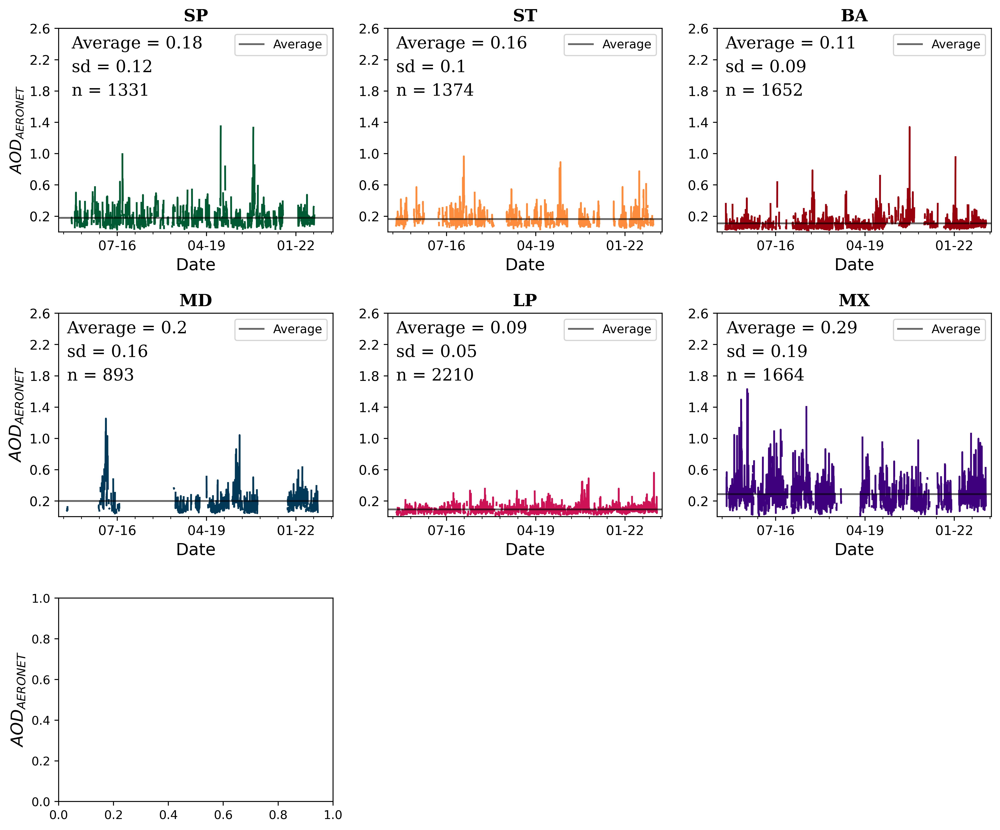

In [5]:
# Correr funcion para Latam 

dir_path_latam = "D:/Josefina/paper_git/paper_maiac/datasets/V02/aeronet/datasets_interp_s_L02/Latam"

date_format_latam = '%Y-%m-%d %H:%M:%S'

nrows=3
ncols=3
color = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d","#c994c7"]
plot= 'NO'
aeronet_plot_latam = aeronet_plot(path=dir_path_latam,date_format=date_format_latam,nrows=nrows,ncols=ncols,colors = color, plot=plot)
aeronet_plot_latam

# Porque queda un plot al final??

1_GS_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  8.85
num_dias faltantes: 841
% dias faltantes: 28.78%
GS
2_GT_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  12.69
num_dias faltantes: 1491
% dias faltantes: 51.03%
GT
3_MS_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  8.41
num_dias faltantes: 1164
% dias faltantes: 39.84%
MS
4_CT_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  12.25
num_dias faltantes: 1186
% dias faltantes: 40.59%
CT
5_SL_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  20.38
num_dias faltantes: 1860
% dias faltantes: 63.66%
SL
6_UH_2015-2022_interp-s_V02_L2.csv
Cuantas veces mas grande es el maximo que la media  5.04
num_dias faltantes: 1487
% dias faltantes: 50.89%
UH


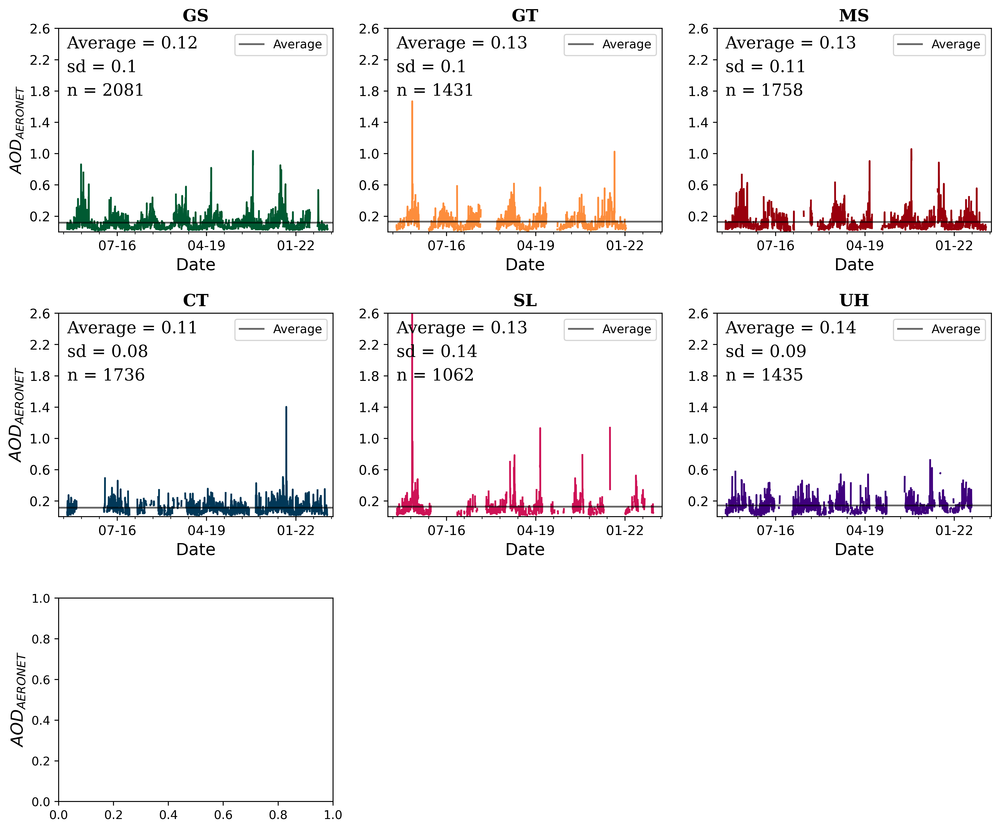

In [6]:
# Correr funcion para USA 
dir_path_usa = "D:/Josefina/paper_git/paper_maiac/datasets/V02/aeronet/datasets_interp_s_L02/USA"
date_format_usa = '%d/%m/%Y %H:%M'
nrows=3
ncols=3
color = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d","#c994c7"]
plot= 'NO'
aeronet_plot_USA = aeronet_plot(path=dir_path_usa,date_format=date_format_usa,nrows=nrows,ncols=ncols,colors = color, plot=plot)

aeronet_plot_USA


--------
## Regresion lineal MAIAC - AERONET
--------

In [45]:

    
# linear regression
def linear_regression_plot (path, date_format,nrows,ncols,color_modis,color_maiac, plot,resolucion_espaciotemporal):
    '''
    The function allows plotting the linear regression of each AERONET station.
    In addition, the main statistics and the linear regression equation are shown.
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.

    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each  for stations MAIAC-MODIS For example: 
    color_modis = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
    color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
    '''
    i=0 
    j=0 
    edge_color_maiac = color_modis #["#004529", "#feb24c","#67000d","#081d58","#67001f","#4d004b"]
    #edge_color_modis = color_modis#["#41ab5d","#feb24c","#cb181d","#045a8d","#ce1256","#810f7c"]
    

    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,   figsize=(14,12),dpi=500)#figsize=(16,8),dpi=500)
    fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        print(p)
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        
        #A column is created with the date called "Timestamp".
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        data.set_index('Timestamp', inplace = True)
        data_mean_period_len =len(data.dropna(how='all'))
 
        # Station Name
        station_name = files [2:4]
        ########################                VARIABLES                ########################
        
        y_maiac = data ["AOD_550_maiac_mean"]
        #y_maiac= data["AOD_550_MAIAC_mean"]
        x= data["AOD_550_AER_mean"]
        
        mask = ~np.isnan(x) & ~np.isnan(y_maiac)#& ~np.isnan(y_modis)
        x= x[mask]
        y_maiac = y_maiac[mask]
        #y_modis = y_modis[mask]
        
        #numero de datos sin contar los NaNs
        n = len(x)
        #Calculo la pendiente, la ordenada al origen y el R2
        slope_maiac , intercept_maiac , r_maiac , p_maiac , stderr_maiac  = scipy.stats.linregress(x , y_maiac)
        #slope_modis , intercept_modis , r_modis , p_modis , stderr_modis  = scipy.stats.linregress(x , y_modis)

        # R2
        #R2_modis=r_modis*r_modis
                                                                                                               
        R2_maiac=r_maiac*r_maiac

        #Calculo RMSE
        #RMSE_modis = mean_squared_error(y_modis, x, squared = True)
        #RMSE_maiac = mean_squared_error(y_maiac, x, squared = True)
        #RMSE_modis = mean_squared_error(y_modis, x, squared = False)
        RMSE_maiac = mean_squared_error(y_maiac, x, squared = False)
        #bias_modis = round(( sum(y_modis - x)/n),2)
        bias_maiac = round(( sum(y_maiac - x)/n),2)
                
        ########################                PREDICT                ########################
            
        #y_modis_p = data ["AOD_550_MODIS_mean"].values.reshape(-1,1)
        y_maiac_p= data["AOD_550_maiac_mean"].values.reshape(-1,1)
        x_p= data["AOD_550_AER_mean"].values.reshape(-1,1)

        
        #linear_regresion_modis = LinearRegression()
        linear_regresion_maiac = LinearRegression()

        #linear_regresion_modis.fit(x_p,y_modis_p)
        linear_regresion_maiac.fit(x_p,y_maiac_p)

        li_predict_maiac = linear_regresion_maiac.predict(x_p)
        #li_predict_modis = linear_regresion_modis.predict(x_p)
        #print(files)
        ########################                PLOT                ########################
        # Figure
        #Scatter plot Unit vs Ref
        ax[i][j].scatter(x, y_maiac,  c=color_maiac[p] ,edgecolors=edge_color_maiac[p],alpha=0.7,  s=25, label="MAIAC")
        #ax[i][j].scatter(x, y_modis,  c=color_modis[p] ,edgecolors=edge_color_modis[p],alpha=0.7,  s=8)


        #ax[i][j].plot(x_p,li_predict_modis,c=color_modis[p],label='Valores Originales',linestyle="-",linewidth=2.5)
        ax[i][j].plot(x_p,li_predict_maiac,c=edge_color_maiac[p],label='Valores Originales',linestyle="-",linewidth=2.5)
        
        #add the line 1:1
        ax[i][j].plot([0, 2.4], [0,2.4], color='black', linewidth=1, alpha=0.8, linestyle = '--', label="Line 1:1")
        #Ticks
        ax[i][j].yaxis.set_ticks(np.arange(0.2, 2., 0.4))
        ax[i][j].xaxis.set_ticks(np.arange(0.2, 2., 0.4))
        ax[i][j].set_xlim(0, 2.)
        ax[i][j].set_ylim(0, 2.)
        
        ## Linear regression equation
        #ax[i][j].text(0.05, 1.4, "MODIS =" , fontsize=7, ha="left", va="bottom", fontweight = "bold")
#         ax[i][j].text(0.05, 1.75, "MAIAC =", fontsize=12, ha="left", va="bottom",fontweight = "bold")
#         #ax[i][j].text(0.3, 1.4, (str(round (intercept_modis,2)) + " + "+ str(round (slope_modis,2)) + " AOD") , fontsize=7, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
#         ax[i][j].text(0.5, 1.75, (str(round (intercept_maiac,2)) + " + "+ str(round (slope_maiac,2))+ " AOD") , fontsize=12, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

        ax[i][j].text(0.05, 1.75, "MAIAC = " + str(round(intercept_maiac, 2)) + " + " + str(round(slope_maiac, 2)) + " AOD",
              ha="left", va="center", fontdict={'family': 'serif', 'color': 'Black', 'size': 11})

            
        
        
        # Statistics by station
        #ax[i][j].text(1.20, 0.5, "MODIS" , fontsize=8, ha="center", va="bottom", fontweight = "bold")
#         ax[i][j].text(1.5, 0.8, "MAIAC" , fontsize=12, ha="center", va="bottom",fontweight = "bold")
#         ax[i][j].text(1.35, 0.4, r'$R^{2}$ ', fontsize=12, ha="left", va="center")
#         ax[i][j].text(1.35, 0.30, r'$RMSE$ ',fontsize=12,ha="left", va="center")
#         ax[i][j].text(1.35, 0.2, r'$Bias$', fontsize=12,ha="left", va="center")
#         ax[i][j].text(1.35, 0.1, r'$n$    ', fontsize=12,ha="left", va="center")
        
        
        
        

        #Statistics by station for MODIS
        #ax[i][j].text(1.20, 0.4,(round(R2_modis,2)) , fontsize=8, ha="left", va="center")
        #ax[i][j].text(1.20, 0.30,  (round(RMSE_modis,2)) , fontsize=8,ha="left", va="center")
        #ax[i][j].text(1.20, 0.2, (round(bias_modis,2)) , fontsize=8,ha="left", va="center")#,
        #ax[i][j].text(1.20, 0.1, n , fontsize=8,ha="left", va="center")

        # Statistics by station for  MAIAC
#         ax[i][j].text(1.65, 0.4,(round(R2_maiac,2)) , fontsize=12, ha="left", va="center")
#         ax[i][j].text(1.65, 0.30,   (round(RMSE_maiac,2)) , fontsize=12,ha="left", va="center")
#         ax[i][j].text(1.65, 0.2,  (round(bias_maiac,2)) , fontsize=12,ha="left", va="center")#,
#         ax[i][j].text(1.65, 0.1,  n , fontsize=12,ha="left", va="center")
        
        
        ax[i][j].text(1.25, 0.65, "$R^{2}$ = " + str((round(R2_maiac,2))),
              ha="left", va="center", fontdict={'family': 'serif', 'color': 'Black', 'size': 11})
        ax[i][j].text(1.25, 0.50, "$RMSE$ = " + str( (round(RMSE_maiac,2))),
              ha="left", va="center", fontdict={'family': 'serif', 'color': 'Black', 'size': 11})
        ax[i][j].text(1.25, 0.35, "$Bias$ = " + str( (round(bias_maiac,2))),
              ha="left", va="center", fontdict={'family': 'serif', 'color': 'Black', 'size': 11})
        ax[i][j].text(1.25, 0.20, "$n$ = " + str( n),
              ha="left", va="center", fontdict={'family': 'serif', 'color': 'Black', 'size': 11})
        
        
        
         
        # Title of each subplot corresponds to the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=15,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 16})
         # Tittle legend
        #tittle_legend = ["MODIS","MAIAC"]
        #ax[i][j].legend(tittle_legend , frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
        #ax[i][j].legend(frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
        # Axes names
        ax[i][j].set_xlabel(r'$AOD_{AERONET}$',size=12)
        ax[0][0].set_ylabel(r'$AOD_{SATELLITE}$',size=12)
        ax[0][1].set_ylabel(r'',size=12)
        ax[0][2].set_ylabel(r'',size=12)
        ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=12)
        ax[1][1].set_ylabel(r'',size=12)
        ax[1][2].set_ylabel(r'',size=12) 
        ax[2][0].set_ylabel(r'$AOD_{SATELLITE}$',size=12) 
        

        # Configuration of subplots
        plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)
        ax[2,1].set_visible(False)
        ax[2,2].set_visible(False)
        # Location of data in each subplot
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
   # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("linear_regression_plot.jpg", dpi=500))
    else:
        return(plt.show())

### Regresion lineal MAIAC - AERONET USA DIA C6.1 1KM-60min

0
1
2
3
4
5
6


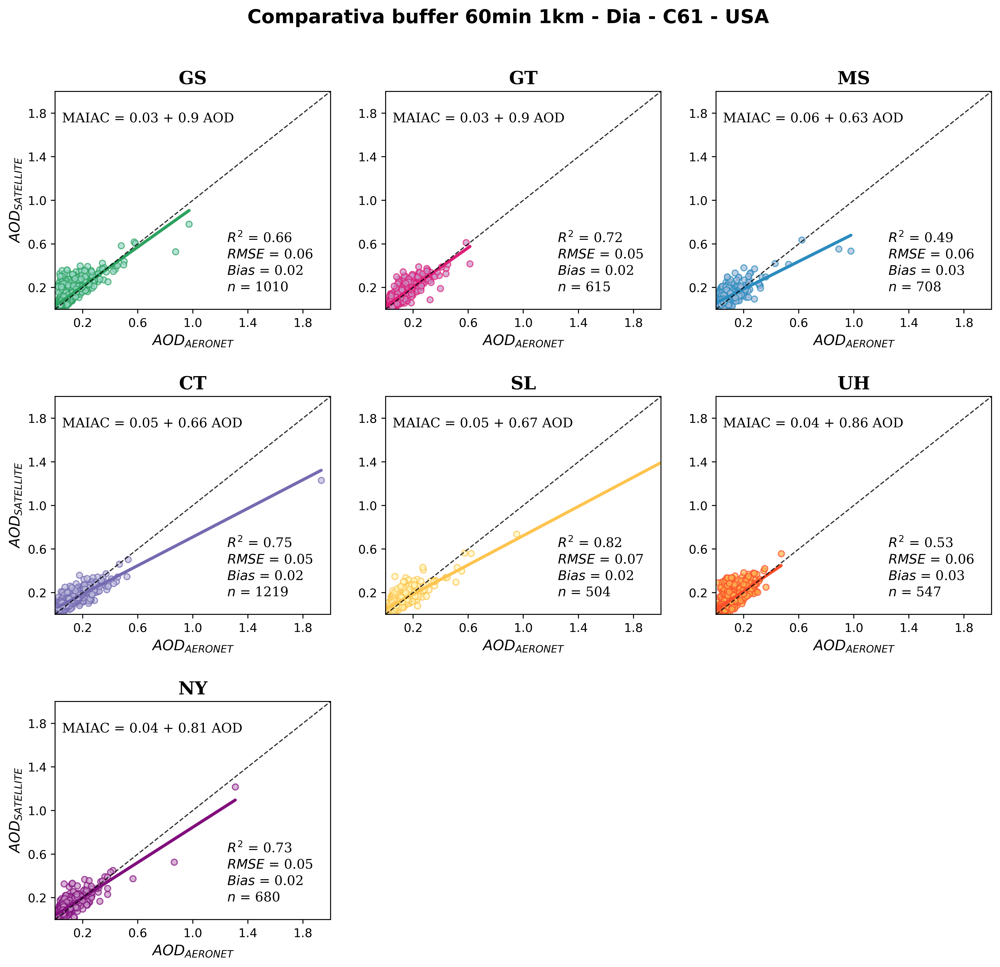

In [57]:
direc = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/horario/1km_v2/"
resolucion_espaciotemporal =  "Comparativa buffer 60min 1km - Dia - C61 - USA"
color = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d","#c994c7"]
color_modis = ["#2ca25f","#dd1c77","#2b8cbe","#756bb1","#fec44f" ,"#fc4e2a","#810f7c" ]
color_maiac = ["#99d8c9","#c994c7" ,"#a6bddb","#bcbddc","#fff7bc", "#feb24c","#c994c7"]



linear_regression_plot (path=direc,date_format='%d/%m/%Y',nrows=3,ncols=3,color_modis = color_modis,color_maiac = color_maiac,plot='na',resolucion_espaciotemporal=resolucion_espaciotemporal)

### Regresion lineal MAIAC - AERONET Latam DIA C6.1 1KM-60min

0
1
2
3
4
5
6


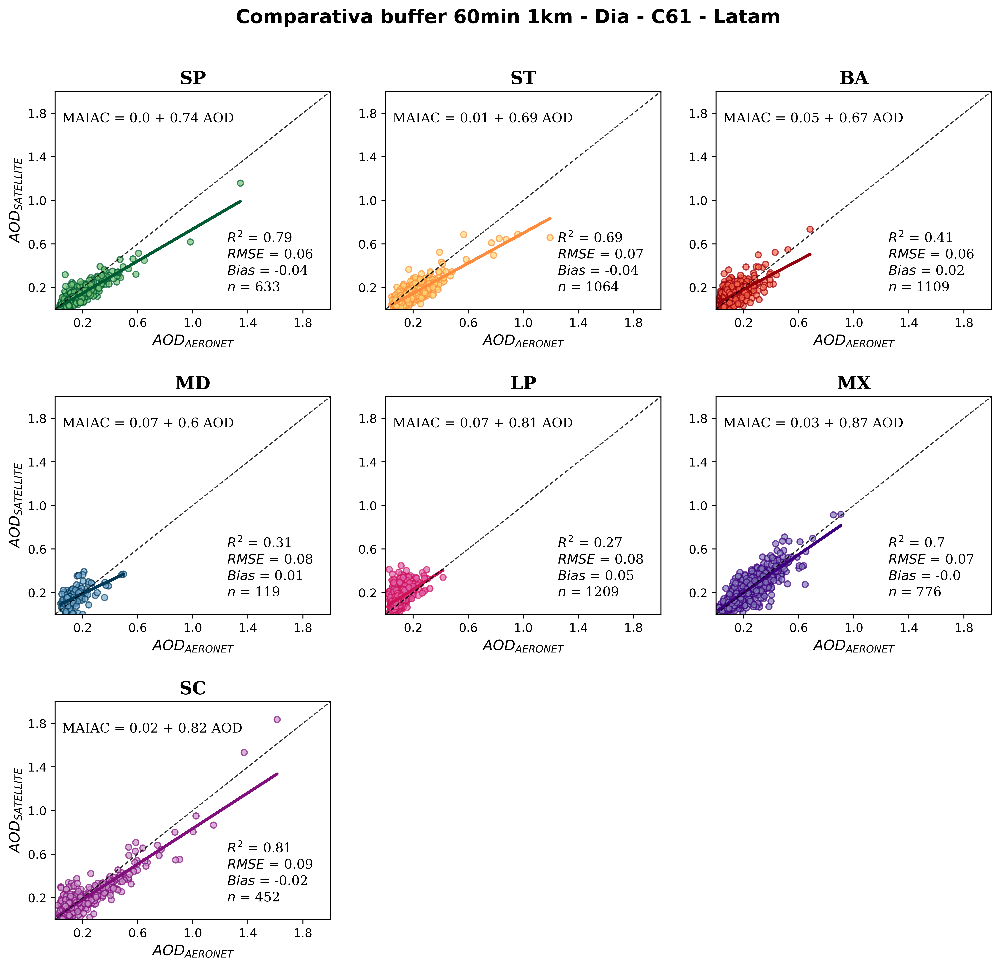

In [58]:
direc = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/Latam_C61/horario/1km_v2/"
resolucion_espaciotemporal =  "Comparativa buffer 60min 1km - Dia - C61 - Latam"
color_maiac= ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba", "#c994c7"]
color_modis= ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d","#810f7c" ]


linear_regression_plot (path=direc,date_format='%d/%m/%Y',nrows=3,ncols=3,color_modis = color_modis,color_maiac = color_maiac,plot='na',resolucion_espaciotemporal=resolucion_espaciotemporal)

-------
## REU segun buffer espacial
-----

In [12]:
def REU_list(DF,Lambda = 1, u_xi = 0.0):

    #DF = data
    Lambda = 1
    u_xi = 0.0
    Sigma_err_x = u_xi
    # These are lists where I will save the different results
    list_u_1 = []
    list_reu_1 = []
    list_bias_1 = []
    list_noise_1 = []
    list_reux_1 = []
    list_biasx_1 = []
    list_noisex_1 = []
    ##
    list_u_3 = []
    list_reu_3 = []
    list_bias_3 = []
    list_noise_3 = []
    list_reux_3 = []
    list_biasx_3 = []
    list_noisex_3 = []
    list_verificacion_3 = []

    list_u_5 = []
    list_reu_5 = []
    list_bias_5 = []
    list_noise_5 = []
    list_reux_5 = []
    list_biasx_5 = []
    list_noisex_5 = []

    list_u_15 = []
    list_reu_15 = []
    list_bias_15 = []
    list_noise_15 = []
    list_reux_15 = []
    list_biasx_15 = []
    list_noisex_15 = []

    list_u_25 = []
    list_reu_25 = []
    list_bias_25 = []
    list_noise_25 = []
    list_reux_25 = []
    list_biasx_25 = []
    list_noisex_25 = []
    x_1 = DF['AOD_550_AER_mean_1'] #AERONET
    y_1 = DF["AOD_550_maiac_mean_1"] # Pollutant
    ##
    x_3 = DF['AOD_550_AER_mean_3'] #AERONET
    y_3 = DF["AOD_550_maiac_mean_3"] # Pollutant
    ##
    x_5 = DF['AOD_550_AER_mean_5'] #AERONET
    y_5 = DF["AOD_550_maiac_mean_5"] # Pollutant
    ##
    x_15 = DF['AOD_550_AER_mean_15'] #AERONET
    y_15 = DF["AOD_550_maiac_mean_15"] # Pollutant

    x_25 = DF['AOD_550_AER_mean_25'] #AERONET
    y_25 = DF["AOD_550_maiac_mean_25"] # Pollutant

    #Masking the NaN's
    mask_1 = ~np.isnan(x_1) & ~np.isnan(y_1)
    x_1 = x_1[mask_1]
    y_1 = y_1[mask_1]
    n_1 = len(x_1)
    ##
    mask_3 = ~np.isnan(x_3) & ~np.isnan(y_3)
    x_3 = x_3[mask_3]
    y_3 = y_3[mask_3]
    n_3 = len(x_3)
    ##
    mask_5 = ~np.isnan(x_5) & ~np.isnan(y_5)
    x_5 = x_5[mask_5]
    y_5 = y_5[mask_5]
    n_5 = len(x_5)
    ##
    mask_15 = ~np.isnan(x_15) & ~np.isnan(y_15)
    x_15 = x_15[mask_15]
    y_15 = y_15[mask_15]
    n_15 = len(x_15)
    ##
    mask_25 = ~np.isnan(x_25) & ~np.isnan(y_25)
    x_25 = x_25[mask_25]
    y_25 = y_25[mask_25]
    n_25 = len(x_25)

    #Slope & Intercept usando REGRESION LINEAL (LR)
    slope_1, intercept_1, r_1, p_1, stderr_1 = scipy.stats.linregress(x_1[mask_1], y_1[mask_1])
    b1_1 = slope_1
    b0_1 = intercept_1
    #Slope & Intercept usando REGRESION LINEAL (LR)
    slope_3, intercept_3, r_3, p_3, stderr_3 = scipy.stats.linregress(x_3[mask_3], y_3[mask_3])
    b1_3 = slope_3
    b0_3 = intercept_3

    #Slope & Intercept usando REGRESION LINEAL (LR)
    slope_5, intercept_5, r_5, p_5, stderr_5 = scipy.stats.linregress(x_5[mask_5], y_5[mask_5])
    b1_5 = slope_5
    b0_5 = intercept_5

    #Slope & Intercept usando REGRESION LINEAL (LR)
    slope_15, intercept_15, r_15, p_15, stderr_15 = scipy.stats.linregress(x_15[mask_15], y_15[mask_15])
    b1_15 = slope_15
    b0_15 = intercept_15
    #Slope & Intercept usando REGRESION LINEAL (LR)
    slope_25, intercept_25, r_25, p_25, stderr_25 = scipy.stats.linregress(x_25[mask_25], y_25[mask_25])
    b1_25 = slope_25
    b0_25 = intercept_25



    #Equation error variance for y = b0 + b1*x + v_i
    rss_1 = (y_1 - b0_1 - b1_1*x_1)**2
    RSS_1 = rss_1.values.sum()
    Sigma_v_sqr_1 = RSS_1/(n_1-2)
    #Equation error variance for y = b0 + b1*x + v_i
    rss_3 = (y_3 - b0_3 - b1_3*x_3)**2
    RSS_3 = rss_3.values.sum()
    Sigma_v_sqr_3 = RSS_3/(n_3-2)
    #Equation error variance for y = b0 + b1*x + v_i
    rss_5 = (y_5 - b0_5 - b1_5*x_5)**2
    RSS_5 = rss_5.values.sum()
    Sigma_v_sqr_5 = RSS_5/(n_5-2)
    #Equation error variance for y = b0 + b1*x + v_i
    rss_15 = (y_15 - b0_15 - b1_15*x_15)**2
    RSS_15 = rss_15.values.sum()
    Sigma_v_sqr_15 = RSS_15/(n_15-2)
    #Equation error variance for y = b0 + b1*x + v_i
    rss_25 = (y_25 - b0_25 - b1_25*x_25)**2
    RSS_25 = rss_25.values.sum()
    Sigma_v_sqr_25 = RSS_25/(n_25-2)

    #Error variance due to the deviation of the 1:1 line
    ec_1 = (b0_1 + (b1_1 - 1)*x_1)**2
    ran_1 = Sigma_v_sqr_1 - Sigma_err_x**2
    #Error variance due to the deviation of the 1:1 line
    ec_3 = (b0_3 + (b1_3 - 1)*x_3)**2
    ran_3 = Sigma_v_sqr_3 - Sigma_err_x**2
    #Error variance due to the deviation of the 1:1 line
    ec_5 = (b0_5 + (b1_5 - 1)*x_5)**2
    ran_5 = Sigma_v_sqr_5 - Sigma_err_x**2
    #Error variance due to the deviation of the 1:1 line
    ec_15 = (b0_15 + (b1_15 - 1)*x_15)**2
    ran_15 = Sigma_v_sqr_15 - Sigma_err_x**2
    #Error variance due to the deviation of the 1:1 line
    ec_25 = (b0_25 + (b1_25 - 1)*x_25)**2
    ran_25 = Sigma_v_sqr_25 - Sigma_err_x**2

    #Results
    U_1 = ((ran_1  + ec_1 )**(1/2))
    REU_1  = ((2*100)/y_1 )*U_1 
    bias_1  = ((((2*100)/y_1 )**2)*ec_1 )**(1/2)
    noise_1  = ((((2*100)/y_1 )**2)*ran_1 )**(1/2)
    verificacion_1  = ((bias_1 **2 + noise_1 **2)**(1/2))
    verificacion_u_1  = ((bias_1 **2 + noise_1 **2)**(1/2))/((2*100)/y_1 )
    REUx_1  = 2*U_1 *100/x_1 
    biasx_1  = ((((2*100)/x_1 )**2)*ec_1 )**(1/2)
    noisex_1  = ((((2*100)/x_1 )**2)*ran_1 )**(1/2)
    #Results
    U_3 = ((ran_3  + ec_3)**(1/2))
    REU_3  = ((2*100)/y_3)*U_3 
    bias_3  = ((((2*100)/y_3)**2)*ec_3)**(1/2)
    noise_3  = ((((2*100)/y_3)**2)*ran_3)**(1/2)
    verificacion_3  = ((bias_3 **2 + noise_3 **2)**(1/2))
    verificacion_u_3  = ((bias_3 **2 + noise_3 **2)**(1/2))/((2*100)/y_3)
    REUx_3  = 2*U_3 *100/x_3
    biasx_3  = ((((2*100)/x_3 )**2)*ec_3 )**(1/2)
    noisex_3  = ((((2*100)/x_3 )**2)*ran_3 )**(1/2)
    #Results
    U_5 = ((ran_5  + ec_5)**(1/2))
    REU_5  = ((2*100)/y_5)*U_5 
    bias_5 = ((((2*100)/y_5)**2)*ec_5)**(1/2)
    noise_5  = ((((2*100)/y_5)**2)*ran_5)**(1/2)
    verificacion_5  = ((bias_5 **2 + noise_5 **2)**(1/2))
    verificacion_u_5  = ((bias_5 **2 + noise_5 **2)**(1/2))/((2*100)/y_5)
    REUx_5  = 2*U_5*100/x_5
    biasx_5  = ((((2*100)/x_5)**2)*ec_5)**(1/2)
    noisex_5  = ((((2*100)/x_5 )**2)*ran_5)**(1/2)

    #Results
    U_15 = ((ran_15  + ec_15)**(1/2))
    REU_15  = ((2*100)/y_15)*U_15 
    bias_15 = ((((2*100)/y_15)**2)*ec_15)**(1/2)
    noise_15  = ((((2*100)/y_15)**2)*ran_15)**(1/2)
    verificacion_15  = ((bias_15 **2 + noise_15 **2)**(1/2))
    verificacion_u_15  = ((bias_15 **2 + noise_15 **2)**(1/2))/((2*100)/y_15)
    REUx_15  = 2*U_15*100/x_15
    biasx_15  = ((((2*100)/x_15)**2)*ec_15)**(1/2)
    noisex_15  = ((((2*100)/x_15 )**2)*ran_15)**(1/2)
    #Results
    U_25 = ((ran_25  + ec_25)**(1/2))
    REU_25  = ((2*100)/y_25)*U_25 
    bias_25 = ((((2*100)/y_25)**2)*ec_25)**(1/2)
    noise_25  = ((((2*100)/y_25)**2)*ran_25)**(1/2)
    verificacion_25  = ((bias_25 **2 + noise_25 **2)**(1/2))
    verificacion_u_25  = ((bias_25 **2 + noise_25 **2)**(1/2))/((2*100)/y_25)
    REUx_25  = 2*U_25*100/x_25
    biasx_25  = ((((2*100)/x_25)**2)*ec_25)**(1/2)
    noisex_25  = ((((2*100)/x_25 )**2)*ran_25)**(1/2)

    #The results are each placed in a separate list
    list_u_1.append(U_1)
    list_reu_1.append(REU_1)
    list_bias_1.append(bias_1)
    list_noise_1.append(noise_1)
    #list_verificacion_1.append(verificacion_1)
    list_reux_1.append(REUx_1)
    list_biasx_1.append(biasx_1)
    list_noisex_1.append(noisex_1)
    #The results are each placed in a separate list
    list_u_3.append(U_3)
    list_reu_3.append(REU_3)
    list_bias_3.append(bias_3)
    list_noise_3.append(noise_3)
    list_verificacion_3.append(verificacion_3)
    list_reux_3.append(REUx_3)
    list_biasx_3.append(biasx_3)
    list_noisex_3.append(noisex_3)

    #The results are each placed in a separate list
    list_u_5.append(U_5)
    list_reu_5.append(REU_5)
    list_bias_5.append(bias_5)
    list_noise_5.append(noise_5)
    #list_verificacion_5.append(verificacion_5)
    list_reux_5.append(REUx_5)
    list_biasx_5.append(biasx_5)
    list_noisex_5.append(noisex_5)
    #The results are each placed in a separate list
    list_u_15.append(U_15)
    list_reu_15.append(REU_15)
    list_bias_15.append(bias_15)
    list_noise_15.append(noise_15)
    #list_verificacion_15.append(verificacion_15)
    list_reux_15.append(REUx_15)
    list_biasx_15.append(biasx_15)
    list_noisex_15.append(noisex_15)
    #The results are each placed in a separate list
    list_u_25.append(U_5)
    list_reu_25.append(REU_25)
    list_bias_25.append(bias_25)
    list_noise_25.append(noise_25)
    #list_verificacion_25.append(verificacion_25)
    list_reux_25.append(REUx_25)
    list_biasx_25.append(biasx_25)
    list_noisex_25.append(noisex_25)


    # The generated lists are concatenated
    U_1 = pd.concat(list_u_1, axis=1)
    REU_1 = pd.concat(list_reu_1, axis=1)
    REUx_1 = pd.concat(list_reux_1, axis=1)

    REU_3 = pd.concat(list_reu_3, axis=1)
    REUx_3 = pd.concat(list_reux_3, axis=1)

    REU_5 = pd.concat(list_reu_5, axis=1)
    REUx_5 = pd.concat(list_reux_5, axis=1)

    REU_15 = pd.concat(list_reu_15, axis=1)
    REUx_15 = pd.concat(list_reux_15, axis=1)

    REU_25 = pd.concat(list_reu_25, axis=1)
    REUx_25 = pd.concat(list_reux_25, axis=1)
    # Realizar el merge de las tres columnas en un solo DataFrame
    result = pd.concat([DF['AOD_550_AER_mean_1'], REUx_1,DF['AOD_550_AER_mean_3'], REUx_3,DF['AOD_550_AER_mean_5'], REUx_5, DF['AOD_550_AER_mean_15'], REUx_15,DF['AOD_550_AER_mean_25'], REUx_25], axis=1)
    # Cambiar los nombres de las columnas
    result.columns = ["AOD_550_AER_mean_1", 'REUx_1',"AOD_550_AER_mean_3", 'REUx_3',"AOD_550_AER_mean_5", 'REUx_5',"AOD_550_AER_mean_15", 'REUx_15',"AOD_550_AER_mean_25", 'REUx_25']

    # # Mostrar el resultado
    # result.tail(10)
    df_REUxy = result
    # df_REUxy.columns
    return df_REUxy

In [53]:
# REU PLOT
def REU_plot(path, date_format,nrows,ncols,plot,resolucion_espaciotemporal):
    '''
    This function allows plotting the previously calculated REU. 
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.

    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each  for stations MAIAC-MODIS For example: 
    color_modis = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
    color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
    '''
    i=0 
    j=0 
    

    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,   figsize=(14,12),dpi=500)#figsize=(16,8),dpi=500)
    fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        print(p)
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        station_name = files [2:4]
        
        
        df_REUxy = REU_list(DF=data,Lambda = 1, u_xi = 0.0)
        # Station Name
        station_name = files [2:4]
        ########################                VARIABLES                ########################

        x_1 = df_REUxy["AOD_550_AER_mean_1"]
        y_1 = df_REUxy["REUx_1"]
        x_3 = df_REUxy["AOD_550_AER_mean_3"]
        y_3 = df_REUxy["REUx_3"]
        x_5 = df_REUxy["AOD_550_AER_mean_5"]
        y_5 = df_REUxy["REUx_5"]
        x_15 = df_REUxy["AOD_550_AER_mean_15"]
        y_15 = df_REUxy["REUx_15"]
        x_25 = df_REUxy["AOD_550_AER_mean_25"]
        y_25 = df_REUxy["REUx_25"]

        #Masking the NaN's
        mask_1 = ~np.isnan(x_1) & ~np.isnan(y_1)
        x_1 = x_1[mask_1]
        y_1 = y_1[mask_1]
        n_1 = len(x_1)
        ##
        mask_3 = ~np.isnan(x_3) & ~np.isnan(y_3)
        x_3 = x_3[mask_3]
        y_3 = y_3[mask_3]
        n_3 = len(x_3)
        ##
        mask_5 = ~np.isnan(x_5) & ~np.isnan(y_5)
        x_5 = x_5[mask_5]
        y_5 = y_5[mask_5]
        n_5 = len(x_5)
        ##
        mask_15 = ~np.isnan(x_15) & ~np.isnan(y_15)
        x_15 = x_15[mask_15]
        y_15 = y_15[mask_15]
        n_15 = len(x_15)
        ##
        mask_25 = ~np.isnan(x_25) & ~np.isnan(y_25)
        x_25 = x_25[mask_25]
        y_25 = y_25[mask_25]
        n_25 = len(x_25)

        min_1 = round(min(y_1),2)
        max_1  =  round(max(y_1),2)
        min_3 = round(min(y_3),2)
        max_3  =  round(max(y_3),2)
        min_5 = round(min(y_5),2)
        max_5  =  round(max(y_5),2)
        min_15 = round(min(y_15),2)
        max_15  =  round(max(y_15),2)
        min_25 = round(min(y_25),2)
        max_25  =  round(max(y_25),2)
        
        ###
        df_REUxy_min_1 = df_REUxy[df_REUxy["REUx_1"] == min(y_1)]
        AOD_550_AER_mean_1_min_REU = round(min(df_REUxy_min_1['AOD_550_AER_mean_1']),3)
        ###
        df_REUxy_min_3 = df_REUxy[df_REUxy["REUx_3"] == min(y_3)]
        AOD_550_AER_mean_3_min_REU = round(min(df_REUxy_min_3['AOD_550_AER_mean_3']),3)
        ###
        ###
        df_REUxy_min_5 = df_REUxy[df_REUxy["REUx_5"] == min(y_5)]
        AOD_550_AER_mean_5_min_REU = round(min(df_REUxy_min_5['AOD_550_AER_mean_5']),3)
        ######
        df_REUxy_min_15 = df_REUxy[df_REUxy["REUx_15"] == min(y_15)]
        AOD_550_AER_mean_15_min_REU = round(min(df_REUxy_min_15['AOD_550_AER_mean_15']),3)
        ######
        df_REUxy_min_25 = df_REUxy[df_REUxy["REUx_25"] == min(y_25)]
        AOD_550_AER_mean_25_min_REU = round(min(df_REUxy_min_25['AOD_550_AER_mean_25']),3)


        ########################                PLOT                ########################
        # Figure
        
      
        
        #Scatter plot REU vs Ref
        ax[i][j].scatter(x_1, y_1, s=10, color="#3182bd", alpha=0.5, linewidth=1) ##azul
        ax[i][j].scatter(x_3, y_3, s=10, color= "#2ca25f", alpha=0.5, linewidth=1) #verde
        ax[i][j].scatter(x_5, y_5, s=10, color="#de2d26", alpha=0.5, linewidth=1) #Rojo
        ax[i][j].scatter(x_15, y_15, s=10, color= "#feb24c", alpha=0.5, linewidth=1) #amarillo/narana
        ax[i][j].scatter(x_25, y_25, s=10, color="#c51b8a", alpha=0.5, linewidth=1) #fucsia

        ax[i][j].grid(color = 'grey', linestyle = '--', linewidth = 0.2)

       # The line with the minimum value of MIAC and MODIS is added
        ax[i][j].hlines(y= min_1, xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--')
        ax[i][j].hlines(y=min_3 , xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--')
        ax[i][j].hlines(y=min_5 , xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--')
        ax[i][j].hlines(y=min_15 , xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--')
        ax[i][j].hlines(y=min_25 , xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--')

        
        ax[i][j].text(0.2, 270,(f'$REU 1 = {min_1}$'),
                      ha="left", va="center",fontdict={'family': 'serif', 
                     'color' : 'Black',
                     'weight': 'bold',
                     'size': 9})
        ax[i][j].text(0.2,  250,(f'$REU 3 = {min_3}$'),
                      ha="left", va="center",fontdict={'family': 'serif', 
                     'color' : 'Black',
                     'weight': 'bold',
                     'size': 9})

        ax[i][j].text(0.2, 230,(f'$REU 5 = {min_5}$'),
              ha="left", va="center",fontdict={'family': 'serif', 
             'color' : 'Black',
             'weight': 'bold',
                     'size': 9})
        ax[i][j].text(0.2, 210,(f'$REU 15 = {min_15}$'),
                      ha="left", va="center",fontdict={'family': 'serif', 
                     'color' : 'Black',
                     'weight': 'bold',
                     'size': 9})
        ax[i][j].text(0.2,  190,(f'$REU 25 = {min_25}$'),
                      ha="left", va="center",fontdict={'family': 'serif', 
                             'color' : 'Black',
                             'weight': 'bold',
                             'size': 9})
        # Title of each subplot corresponds toY the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=13,fontdict={'family': 'serif', 'color' : 'Black','weight': 'bold', 'size': 16})
        # X axis limit
        ax[i][j].set_xlim(0,1.2) 
        # Y axis limit
        ax[i][j].set_ylim(0,300)
        # Axes names
        ax[i][j].set_xlabel(r'$AOD_{AERONET}$',size=10)
        ax[i][j].set_ylabel(r'REUx $AOD_{Satellite}$',size=10)
        # Configuration of subplots
        plt.subplots_adjust(left=0.125,bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)
        ax[2,1].set_visible(False)
        ax[2,2].set_visible(False)
        # Tittle legend
        tittle_legend = ["1km","3km","5km","15km","25km"]
        ax[i][j].legend(tittle_legend , frameon = False, markerfirst = False, fontsize = 10)
        # Location of data in each subplot
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
    
       # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("REU_plot.jpg", dpi=500))
    else:
        return(plt.show())
    

#### REUx 60min - Dia - C61 - USA

0
1
2
3
4
5
6


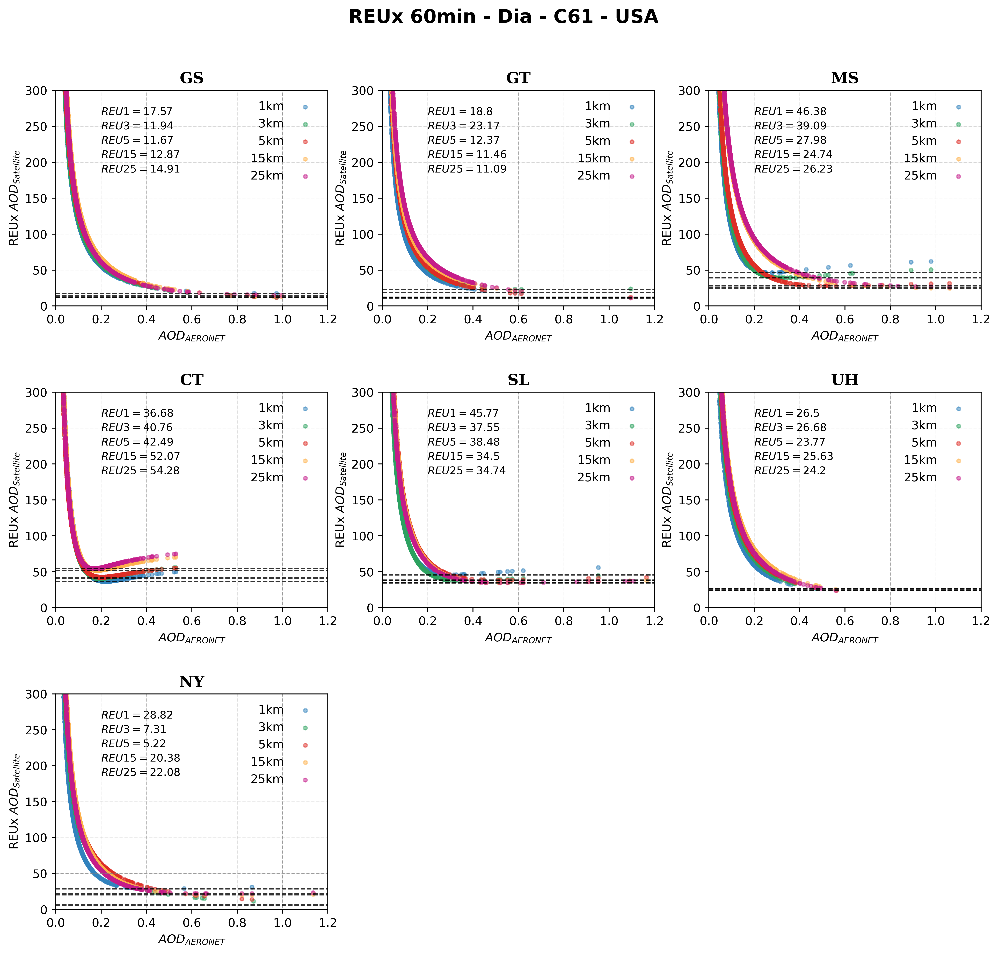

In [59]:

date_format='%Y-%m-%d'
nrows=3
ncols=3
plot ="no"
dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/espacial/60/"
resolucion_espaciotemporal_30 = "REUx 60min - Dia - C61 - USA"
prueba_reu_plot = REU_plot(path=dir_path_30,resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format,nrows=nrows,ncols=ncols,plot=plot)
prueba_reu_plot

#### REUx 60min - Dia - C61 - Latam

0
1
2
3
4
5
6


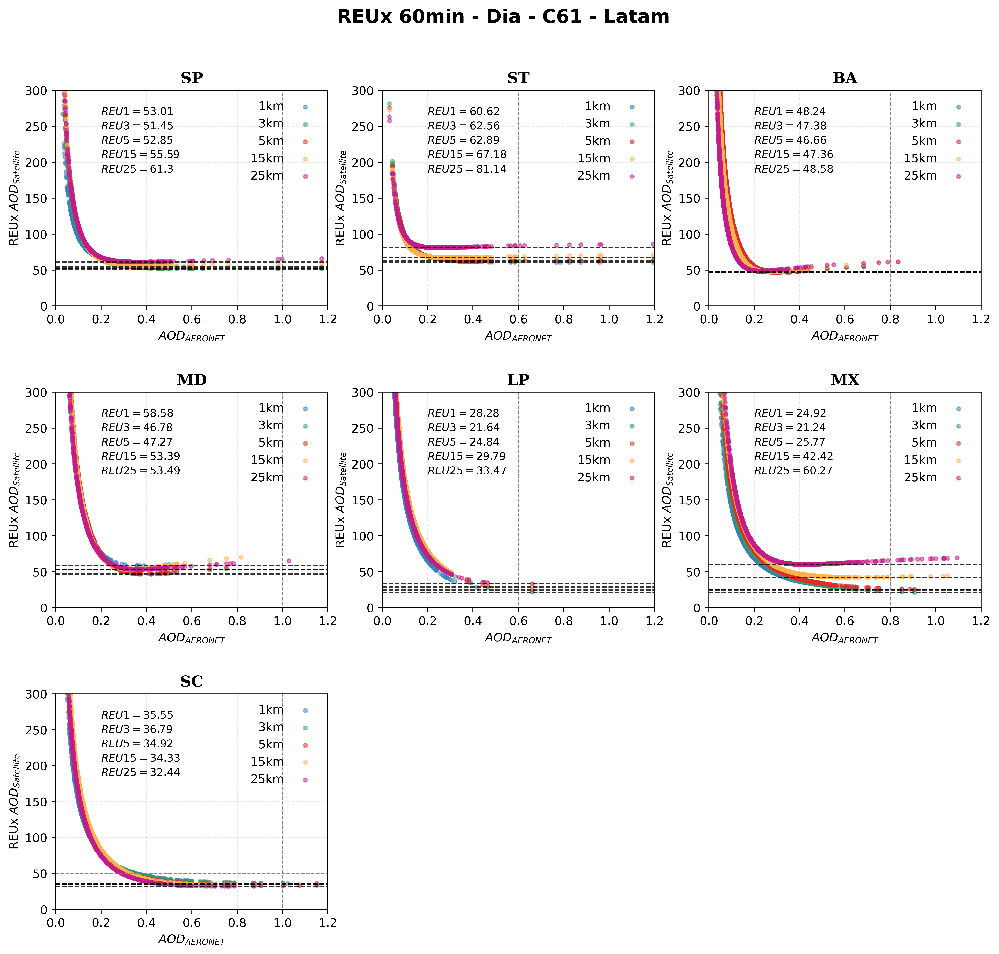

In [60]:
date_format='%Y-%m-%d'
nrows=3
ncols=3
plot ="no"
dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/Latam_C61/espacial/60/"
resolucion_espaciotemporal_30 = "REUx 60min - Dia - C61 - Latam"
prueba_reu_plot = REU_plot(path=dir_path_30,resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format,nrows=nrows,ncols=ncols,plot=plot)
prueba_reu_plot

In [27]:
def REU_plot_single(path, date_format, plot, resolucion_espaciotemporal):
    '''
    This function plots the previously calculated REU in a single plot.
    It reads data from each station in .csv format located in the specified folder.

    Variables:
    - path : path to the folder where the .csv files are located.
    - date_format: format of the date column in the file, e.g., date_format='%Y-%m-%d %H:%M:%S'
    - plot: if 'save', the plot is saved as a .jpg file; otherwise, it's displayed.
    - resolucion_espaciotemporal: title of the plot.
    '''
    
#     fig, ax = plt.subplots(figsize=(10, 12), dpi=500)
    fig, ax = plt.subplots(figsize=(10, 8), dpi=500)
    fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')

    # Color palette for all stations
    colors = ["#3182bd", "#74c476", "#fed976", "#fb6a4a", "#74a9cf", "#df65b0", "#807dba"]
    
    for p, files in enumerate(os.listdir(path)):
        data = pd.read_csv(os.path.join(path, files))
        station_name = files[2:4]
        
        df_REUxy = REU_list(DF=data, Lambda=1, u_xi=0.0)

        # Extract variables
        x_1 = df_REUxy["AOD_550_AER_mean_1"]
        y_1 = df_REUxy["REUx_1"]

        # Masking NaN's
        mask_1 = ~np.isnan(x_1) & ~np.isnan(y_1)
        x_1 = x_1[mask_1]
        y_1 = y_1[mask_1]

        # Scatter plot for each station
        ax.scatter(x_1, y_1, s=10, color=colors[p % len(colors)], alpha=0.5, linewidth=1, label=station_name)
    
    # Plot settings
    ax.grid(color='grey', linestyle='--', linewidth=0.2)
    ax.set_xlim(0, 1.2)
    ax.set_ylim(0, 300)
    ax.set_xlabel(r'$AOD_{AERONET}$', size=10)
    ax.set_ylabel(r'REUx $AOD_{Satellite}$', size=10)
    ax.legend(loc='upper right', frameon=False, fontsize=10)
    
    plt.tight_layout()

    # Save or show the plot
    if plot == 'save':
        plt.savefig("REU_plot_single.jpg", dpi=500)
    else:
        plt.show()


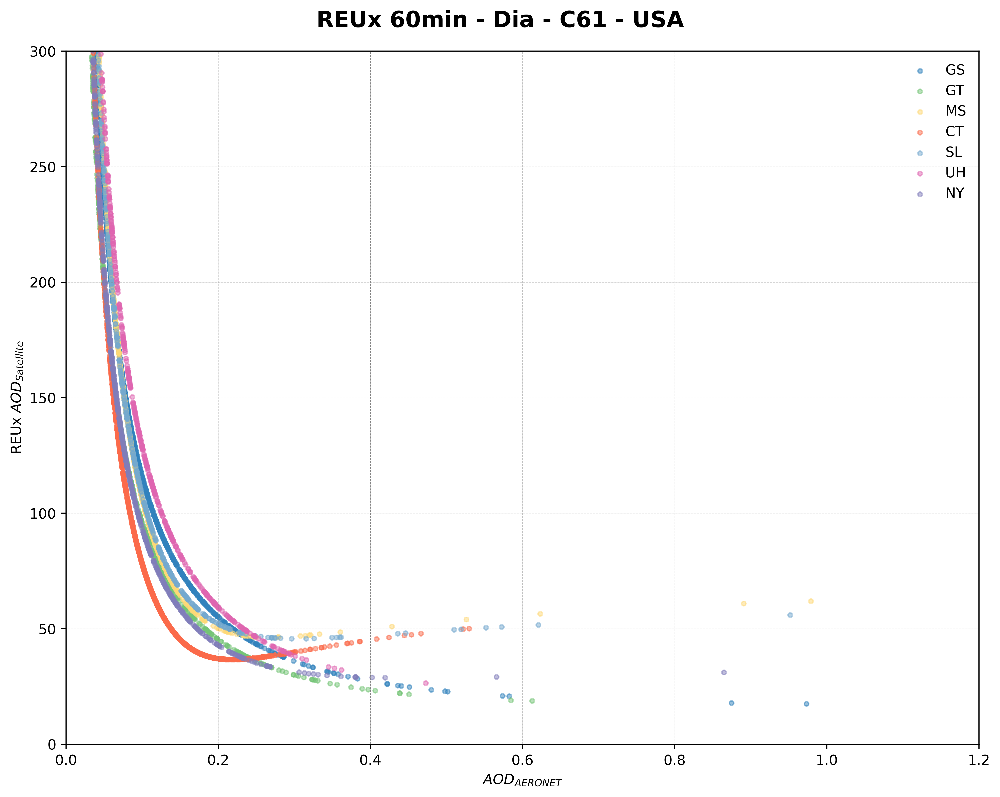

In [28]:
date_format='%Y-%m-%d'
nrows=3
ncols=3
plot ="no"
dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/espacial/60/"
resolucion_espaciotemporal_30 = "REUx 60min - Dia - C61 - USA"
# REU_plot_single_plot = REU_plot_single(path=dir_path_30,resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format,nrows=nrows,ncols=ncols,plot=plot)
# dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/espacial/60/"
# resolucion_espaciotemporal_30 = "REUx 60min - Dia - C61 - USA"

# Llamar a la función sin asignar el resultado a una variable, ya que la función no retorna nada.
REU_plot_single(path=dir_path_30, resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format, plot=plot)


In [29]:
# REU PLOT
def REU_plot_1km(path, date_format,nrows,ncols,plot,resolucion_espaciotemporal):
    '''
    This function allows plotting the previously calculated REU. 
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.

    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each  for stations MAIAC-MODIS For example: 
    color_modis = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
    color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
    '''
    i=0 
    j=0 
    

    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,   figsize=(14,12),dpi=500)#figsize=(16,8),dpi=500)
    fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        print(p)
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        station_name = files [2:4]
        
        
        df_REUxy = REU_list(DF=data,Lambda = 1, u_xi = 0.0)
        # Station Name
        station_name = files [2:4]
        ########################                VARIABLES                ########################

        x_1 = df_REUxy["AOD_550_AER_mean_1"]
        y_1 = df_REUxy["REUx_1"]

        #Masking the NaN's
        mask_1 = ~np.isnan(x_1) & ~np.isnan(y_1)
        x_1 = x_1[mask_1]
        y_1 = y_1[mask_1]
        n_1 = len(x_1)
        ##


        min_1 = round(min(y_1),2)
        max_1  =  round(max(y_1),2)

        ###
        df_REUxy_min_1 = df_REUxy[df_REUxy["REUx_1"] == min(y_1)]
        AOD_550_AER_mean_1_min_REU = round(min(df_REUxy_min_1['AOD_550_AER_mean_1']),3)
        ###



        ########################                PLOT                ########################
        # Figure
        
      
        
        #Scatter plot REU vs Ref
        ax[i][j].scatter(x_1, y_1, s=10, color="#3182bd", alpha=0.5, linewidth=1) ##azul

        ax[i][j].grid(color = 'grey', linestyle = '--', linewidth = 0.2)

       # The line with the minimum value of MIAC and MODIS is added
        ax[i][j].hlines(y= min_1, xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--')


        
        ax[i][j].text(0.2, 270,(f'$REU 1 = {min_1}$'),
                      ha="left", va="center",fontdict={'family': 'serif', 
                     'color' : 'Black',
                     'weight': 'bold',
                     'size': 9})

        # Title of each subplot corresponds toY the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=13,fontdict={'family': 'serif', 'color' : 'Black','weight': 'bold', 'size': 16})
        # X axis limit
        ax[i][j].set_xlim(0,1.2) 
        # Y axis limit
        ax[i][j].set_ylim(0,300)
        # Axes names
        ax[i][j].set_xlabel(r'$AOD_{AERONET}$',size=10)
        ax[i][j].set_ylabel(r'REUx $AOD_{Satellite}$',size=10)
        # Configuration of subplots
        plt.subplots_adjust(left=0.125,bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)
        ax[2,1].set_visible(False)
        ax[2,2].set_visible(False)
        # Tittle legend
        tittle_legend = ["1km","3km","5km","15km","25km"]
        ax[i][j].legend(tittle_legend , frameon = False, markerfirst = False, fontsize = 10)
        # Location of data in each subplot
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
    
       # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("REU_plot.jpg", dpi=500))
    else:
        return(plt.show())

0
1
2
3
4
5
6


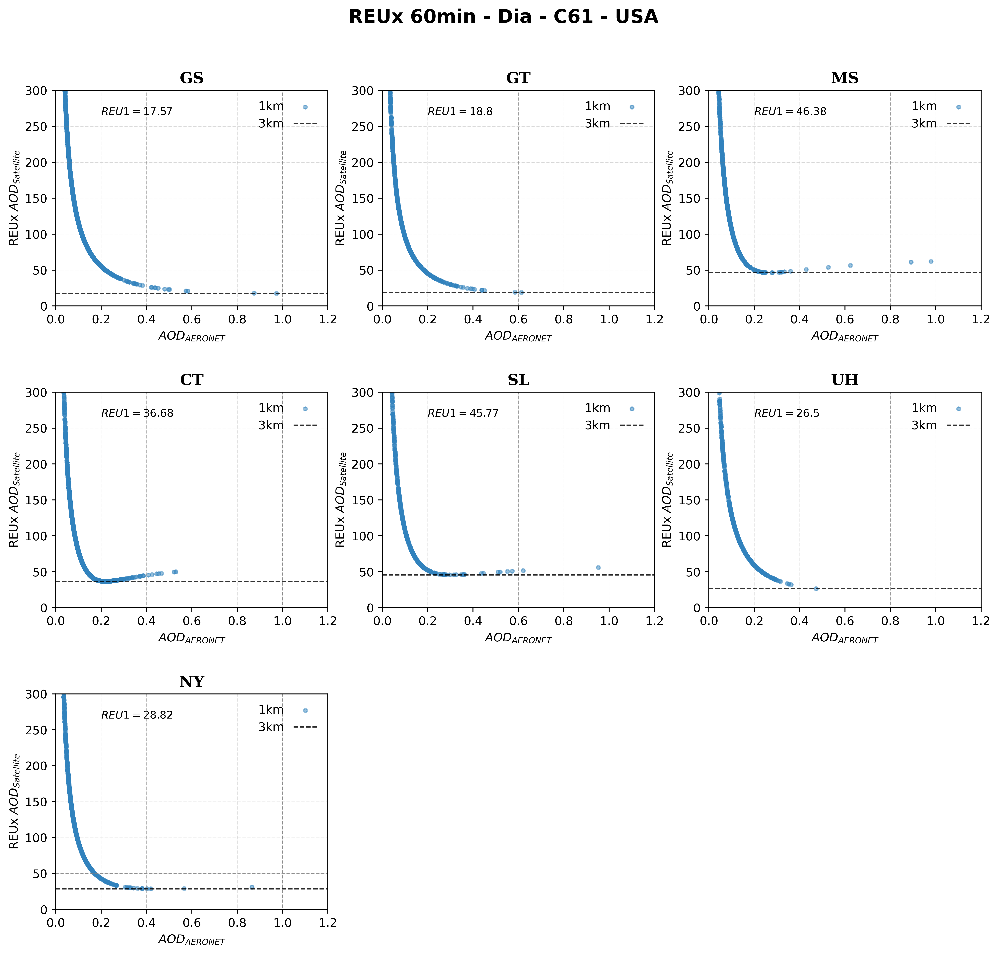

In [30]:

date_format='%Y-%m-%d'
nrows=3
ncols=3
plot ="no"
dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/espacial/60/"
resolucion_espaciotemporal_30 = "REUx 60min - Dia - C61 - USA"
prueba_reu_plot = REU_plot_1km(path=dir_path_30,resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format,nrows=nrows,ncols=ncols,plot=plot)
prueba_reu_plot

In [59]:
def REU_plot_single(path, date_format, plot, resolucion_espaciotemporal):
    '''
    This function plots the previously calculated REU in a single plot.
    It reads data from each station in .csv format located in the specified folder.

    Variables:
    - path : path to the folder where the .csv files are located.
    - date_format: format of the date column in the file, e.g., date_format='%Y-%m-%d %H:%M:%S'
    - plot: if 'save', the plot is saved as a .jpg file; otherwise, it's displayed.
    - resolucion_espaciotemporal: title of the plot.
    '''
    
    fig, ax = plt.subplots(figsize=(8, 6), dpi=500)
    fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')

    # Color palette for all stations
    colors = ["#3182bd", "#74c476", "#fed976", "#fb6a4a", "#74a9cf", "#df65b0", "#807dba"]
    
    # Set initial y position for the text
    y_position = 250  # Starting point for the first text
    y_step = 15        # Step to decrease the y position for each station

    for p, files in enumerate(os.listdir(path)):
        data = pd.read_csv(os.path.join(path, files))
        station_name = files[2:4]
        
        df_REUxy = REU_list(DF=data, Lambda=1, u_xi=0.0)

        # Extract variables
        x_1 = df_REUxy["AOD_550_AER_mean_1"]
        y_1 = df_REUxy["REUx_1"]

        # Masking NaN's
        mask_1 = ~np.isnan(x_1) & ~np.isnan(y_1)
        x_1 = x_1[mask_1]
        y_1 = y_1[mask_1]
               # Scatter plot for each station
        ax.scatter(x_1, y_1, s=12, color=colors[p % len(colors)], alpha=0.5, linewidth=1, label=station_name)
        
        # Get minimum value of y_1
        min_y_1 = min(y_1)
        
        # Print minimum value on the plot at a fixed x position and decreasing y position
        ax.text(0.4, y_position, f'{station_name} =: {min_y_1:.2f}', fontsize=15, color=colors[p % len(colors)])
        
        # Decrease the y position for the next station
        y_position -= y_step
#Para USA
#     ax.hlines(y=17.57 , xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--', label = "Min REU")
 #Para latam
    ax.hlines(y=24.92 , xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--', label = "Min REU")

    # Plot settings
    ax.grid(color='grey', linestyle='--', linewidth=0.2)
    ax.set_xlim(0, 1.2)
    ax.set_ylim(0, 300)
    ax.set_xlabel(r'$AOD_{AERONET}$', size=18)
    ax.set_ylabel(r'REU $AOD_{Satellite}$', size=18)
    ax.tick_params(axis='both', labelsize=15)
#     ax.legend( frameon=False, markerfirst = False,  fontsize=15)#loc='upper right',
    # Adjust the legend: increase the size of the scatterpoints
    ax.legend(frameon=False, fontsize=15, scatterpoints=1, markerscale=2)
    
    plt.tight_layout()

    # Save or show the plot
    if plot == 'save':
        plt.savefig("REU_plot_single.jpg", dpi=500)
    else:
        plt.show()



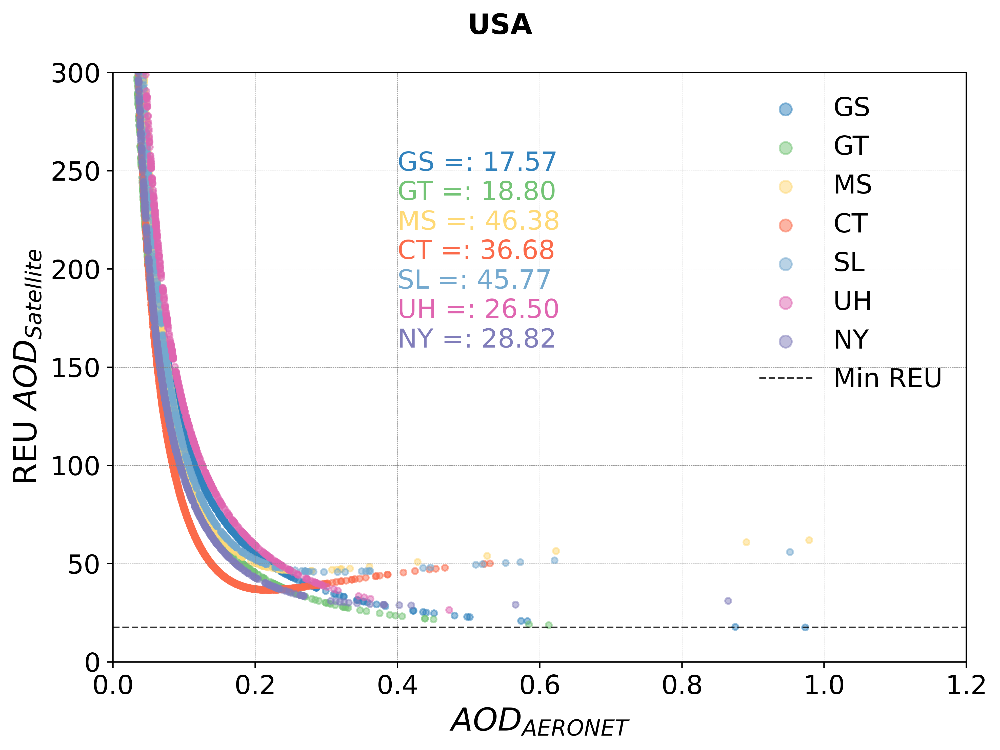

In [60]:
date_format='%Y-%m-%d'
nrows=3
ncols=3
plot ="no"
dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/espacial/60/"
resolucion_espaciotemporal_30 = "USA"
# REU_plot_single_plot = REU_plot_single(path=dir_path_30,resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format,nrows=nrows,ncols=ncols,plot=plot)
# dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/espacial/60/"
# resolucion_espaciotemporal_30 = "REUx 60min - Dia - C61 - USA"

# Llamar a la función sin asignar el resultado a una variable, ya que la función no retorna nada.
REU_plot_single(path=dir_path_30, resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format, plot=plot)


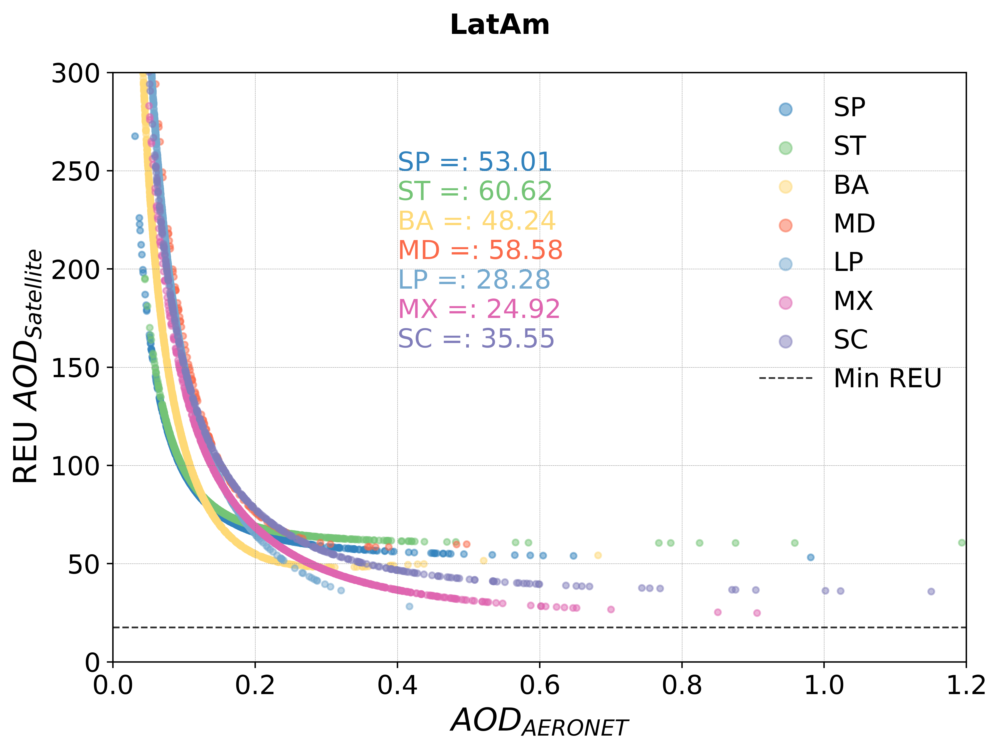

In [61]:
date_format='%Y-%m-%d'
nrows=3
ncols=3
plot ="no"
dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/Latam_C61/espacial/60/"
resolucion_espaciotemporal_30 = "LatAm"
# REU_plot_single_plot = REU_plot_single(path=dir_path_30,resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format,nrows=nrows,ncols=ncols,plot=plot)
# dir_path_30 = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/espacial/60/"
# resolucion_espaciotemporal_30 = "REUx 60min - Dia - C61 - USA"

# Llamar a la función sin asignar el resultado a una variable, ya que la función no retorna nada.
REU_plot_single(path=dir_path_30, resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format, plot=plot)
